In [1]:
from simulacion import *

# Paso 1 (Generar las dinámicas que producen los cuerpos)

In [2]:
tiempoTotal=1.21#tiempo total 1 año
n=500 #numero de puntos
m1=6.24 #masa 6.24E24
t=0 #tiempo inicial
G=6.674-11#Constante de gravitación universal
Y=np.array([0,1.5,3,0])#1.5E11 kg, 3E4m/s
x,y,vx,vy,time=rungeKuttaTwo(tiempoTotal,n,m1,t,Y,f)

# Paso 2 (Obtener un conjunto de posibles direcciones de los cometas)

In [3]:
InitialComets=CometPopulation(x,y)
Elect=np.random.randint(500)
pos=[InitialComets[np.random.randint(500)] for i in range(20)]

# Paso 3 (Generar la masa, radio y capacidad de salir del sistema, así como la probabilidad de un encuentro estelar a partir del tiempo)

In [4]:
def prob2(x,m1,y1,r1):
    return 5e8*np.tanh(x*m1*y1*r1)

In [5]:
m2=np.random.rand(20)*(1e-9-1e-11)+1e-11#masa
r1=np.random.rand(20)*(10-1)+1#radio
y1= np.random.rand(20)
ProbabilidadEscape=[prob2(time[1:],m2[i],r1[i],y1[i]) for i in range(20)]

In [6]:
# m2=np.random.rand()*(1e-9-1e-11)+1e-11#masa
# r1=np.random.rand()*(10-1)+1#radio
# y1= np.random.rand()
# ProbabilidadEscape=prob2(time[1:],m2,r1,y1)

# Paso 4 (Se calcula la velocidad del cometa segun una simulación metropolis hasting)

In [7]:
K,d=metropolisHastingUniform(0.1,1000,velocity)
velpos=[K[np.random.randint(1000)] for i in range(20)]

# Paso 5 (Se agrupa todo en el sistema binario)

In [8]:
comet=np.zeros((20,500,4))
aparicion=[cometAppears(ProbabilidadEscape[i]) for i in range(20)]
for i in range(20):
    comet[i][:aparicion[i]]=np.ones((aparicion[i],4))*[pos[i][0],pos[i][1],velpos[i][0],velpos[i][1]]

In [9]:
for i in range(20):
    masa=np.array([m2[i],m1])
    for j in range(aparicion[i],len(x)):
        Y1=[comet[i][j-1][0],comet[i][j-1][1],x[j-1],y[j-1],comet[i][j-1][2],comet[i][j-1][3],vx[i-1],vy[i-1]]
        Sol,time1=solver(time[j],2,time[j-1],Y1,masa,EDKepler)
        comet[i][j]=[Sol[1][0],Sol[1][1],Sol[1][4],Sol[1][5]] 


In [10]:
# masa=np.array([m2,m1])
# comet=np.zeros((500,4))
# aparicion=cometAppears(ProbabilidadEscape)
# comet[:aparicion]=np.ones((aparicion,4))*[pos[0],pos[1],velpos[0],velpos[1]]
# for i in range(aparicion,len(x)):
#     Y1=[comet[i-1][0],comet[i-1][1],x[i-1],y[i-1],comet[i-1][2],comet[i-1][3],vx[i-1],vy[i-1]]
#     Sol,time1=solver(time[i],2,time[i-1],Y1,masa,EDKepler)
#     comet[i]=[Sol[1][0],Sol[1][1],Sol[1][4],Sol[1][5]]

# Paso 6 (Animación)

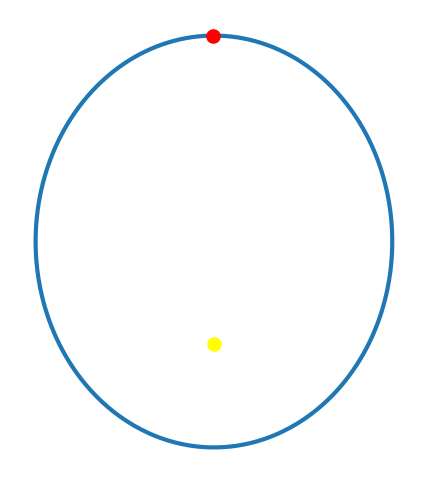

In [29]:

fig = plt.figure() 
ax = plt.axes(xlim=(min(x)-0.1, max(x)+0.1), ylim=(min(y)-0.1, max(y)+0.1)) 
#ax = plt.axes() 
line, = plt.plot([], [], lw=2) 

def init(): 
    line.set_data([], []) 
    return line, 

xdata, ydata = [], [] 

redDot, = plt.plot([0], [0], 'ro')


point1, = plt.plot(comet[0][0][0], comet[0][0][1], 'ro', color="green")
point2, = plt.plot(comet[1][0][0], comet[1][0][1], 'ro', color="green")
point3, = plt.plot(comet[2][0][0], comet[2][0][1], 'ro', color="green")
point4, = plt.plot(comet[3][0][0], comet[3][0][1], 'ro', color="green")
point5, = plt.plot(comet[4][0][0], comet[4][0][1], 'ro', color="green")
point6, = plt.plot(comet[5][0][0], comet[5][0][1], 'ro', color="green")
point7, = plt.plot(comet[6][0][0], comet[6][0][1], 'ro', color="green")
point8, = plt.plot(comet[7][0][0], comet[7][0][1], 'ro', color="green")
point9, = plt.plot(comet[8][0][0], comet[8][0][1], 'ro', color="green")
point10, = plt.plot(comet[9][0][0], comet[9][0][1], 'ro', color="green")
point11, = plt.plot(comet[10][0][0], comet[10][0][1], 'ro', color="green")
point12, = plt.plot(comet[11][0][0], comet[11][0][1], 'ro', color="green")
point13, = plt.plot(comet[12][0][0], comet[12][0][1], 'ro', color="green")
point14, = plt.plot(comet[13][0][0], comet[13][0][1], 'ro', color="green")
point15, = plt.plot(comet[14][0][0], comet[14][0][1], 'ro', color="green")
point16, = plt.plot(comet[15][0][0], comet[15][0][1], 'ro', color="green")
point17, = plt.plot(comet[16][0][0], comet[16][0][1], 'ro', color="green")
point18, = plt.plot(comet[17][0][0], comet[17][0][1], 'ro', color="green")
point19, = plt.plot(comet[18][0][0], comet[18][0][1], 'ro', color="green")
point20, = plt.plot(comet[19][0][0], comet[19][0][1], 'ro', color="green")
def animate(i): 
    xdata.append(x[i]) 
    ydata.append(y[i]) 
    line.set_data(xdata, ydata) 
    redDot.set_data(x[i], y[i])
    #pointdexter.set_data(comet[j][i][0], comet[j][i][1])
    
    point1.set_data(comet[0][i][0], comet[0][i][1])
    point2.set_data(comet[1][i][0], comet[1][i][1])
    point3.set_data(comet[2][i][0], comet[2][i][1])
    point4.set_data(comet[3][i][0], comet[3][i][1])
    point5.set_data(comet[4][i][0], comet[4][i][1])
    point6.set_data(comet[5][i][0], comet[5][i][1])
    point7.set_data(comet[6][i][0], comet[6][i][1])
    point8.set_data(comet[7][i][0], comet[7][i][1])
    point9.set_data(comet[8][i][0], comet[8][i][1])
    point10.set_data(comet[9][i][0], comet[9][i][1])
    point11.set_data(comet[10][i][0], comet[10][i][1])
    point12.set_data(comet[11][i][0], comet[11][i][1])
    point13.set_data(comet[12][i][0], comet[12][i][1])
    point14.set_data(comet[13][i][0], comet[13][i][1])
    point15.set_data(comet[14][i][0], comet[14][i][1])
    point16.set_data(comet[15][i][0], comet[15][i][1])
    point17.set_data(comet[16][i][0], comet[16][i][1])
    point18.set_data(comet[17][i][0], comet[17][i][1])
    point19.set_data(comet[18][i][0], comet[18][i][1])
    point20.set_data(comet[19][i][0], comet[19][i][1])
    
    #return line, redDot, point1,point2,point3,point4,point5,point6,point7,point8,point9,point10,point11,point12,point13,point14,point15,point16,point17,point18,point19,point20
    return line, redDot, point1,point2,point3,point4,point5,point6,point7,point8,point9,point10,point11,point12,point13,point14,point15,point16,point17,point18,point19,point20
    #return line,redDot,
    


plt.axis('off') 
plt.scatter(0,0,color="yellow",label="sol")
plt.gca().set_aspect('equal')


anim = FuncAnimation(fig, animate, init_func=init,frames=500, interval=200, blit=True) 
#anim.save('solar2.gif', fps=4000, dpi=200)
anim